In [6]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import glob
from hera_cal import io
from hera_cal import redcal
from hera_cal import apply_cal
import os
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Purpose:

The purpose of this notebook is to check on the redundancy of baselines after applying smoothcal calibration solutions. Smooth fits to calibration solutions do not technically enforce gain smoothness. 

In [7]:
# Use environment variables to figure out path to data
JD = os.environ['JULIANDATE']
data_path = os.environ['DATA_PATH']
print(f'JD = {JD}')
print(f'data_path = "{data_path}"')
JD = int(JD)
n_bl_grps = os.environ['N_BL_GRPS'] # number of baseline groups to inspect (ordered by number of baselines).
bl_grp_stride = os.environ['BL_GRP_STRIDE'] # spacing between each baseline group
bl_grp_start = os.environ['BL_GRP_START'] # start index for bl groups.
start_index = os.environ['START_INDEX'] # start index for files to inspect.
chunk_size = os.environ['CHUNK_SIZE'] # Number of files to read in per chunk
stride_length = os.environ['STRIDE_LENGTH'] # Number of files to between chunk starts.

KeyError: 'JULIANDATE'

In [8]:
# set manually for now
JD = 2459122
data_path = '/lustre/aoc/projects/hera/H4C/2459122'
n_bl_grps = 5
bl_grp_stride = 5
bl_grp_start = 2
start_index = 200
chunk_size = 2
stride_length = 600 

Load in data.

In [9]:
omnivis_files = sorted(glob.glob(f'{data_path}/zen.{JD}.*.sum.omni_vis.uvh5'))
smooth_avg_files = sorted(glob.glob(f'{data_path}/zen.{JD}.*.sum.smooth_avg_vis.uvh5'))
sum_files = sorted(glob.glob(f'{data_path}/zen.{JD}.*.sum.uvh5'))
cal_files = sorted(glob.glob(f'{data_path}/zen.{JD}.*.smooth_abs.calfits'))

Loop through chunks

In [10]:
omni_chunks = [omnivis_files[i: i+chunk_size] for i in range(start_index, len(omnivis_files), stride_length)]
smooth_avg_chunks = [smooth_avg_files[i: i+chunk_size] for i in range(start_index, len(omnivis_files), stride_length)]
cal_chunks = [cal_files[i: i+chunk_size] for i in range(start_index, len(cal_files), stride_length)]
sum_chunks = [sum_files[i: i+chunk_size] for i in range(start_index, len(sum_files), stride_length)]


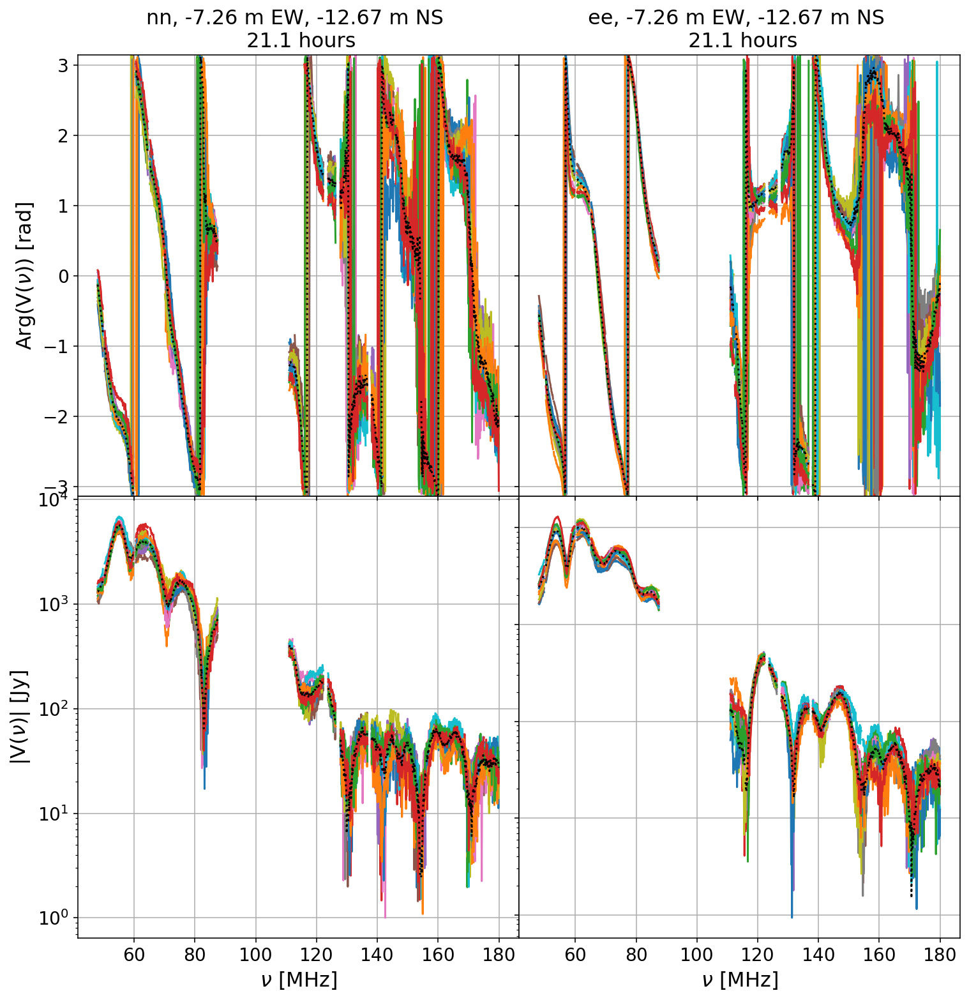

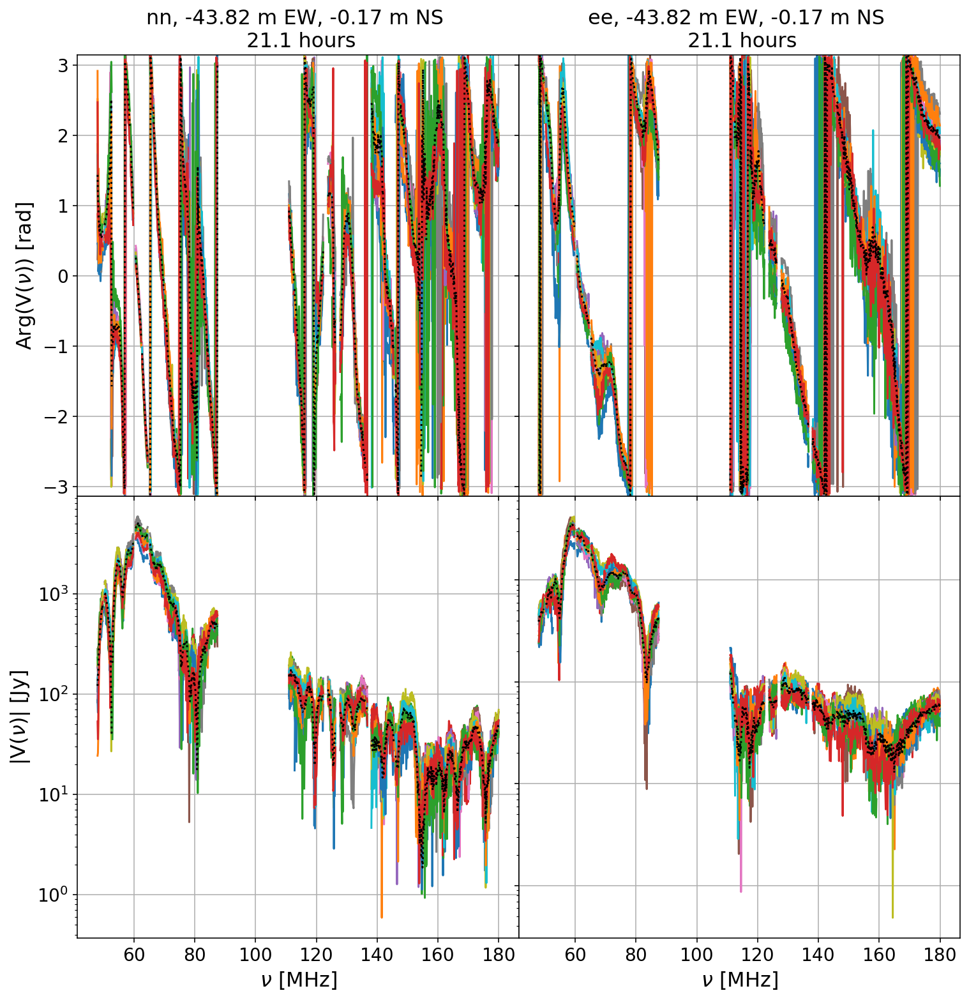

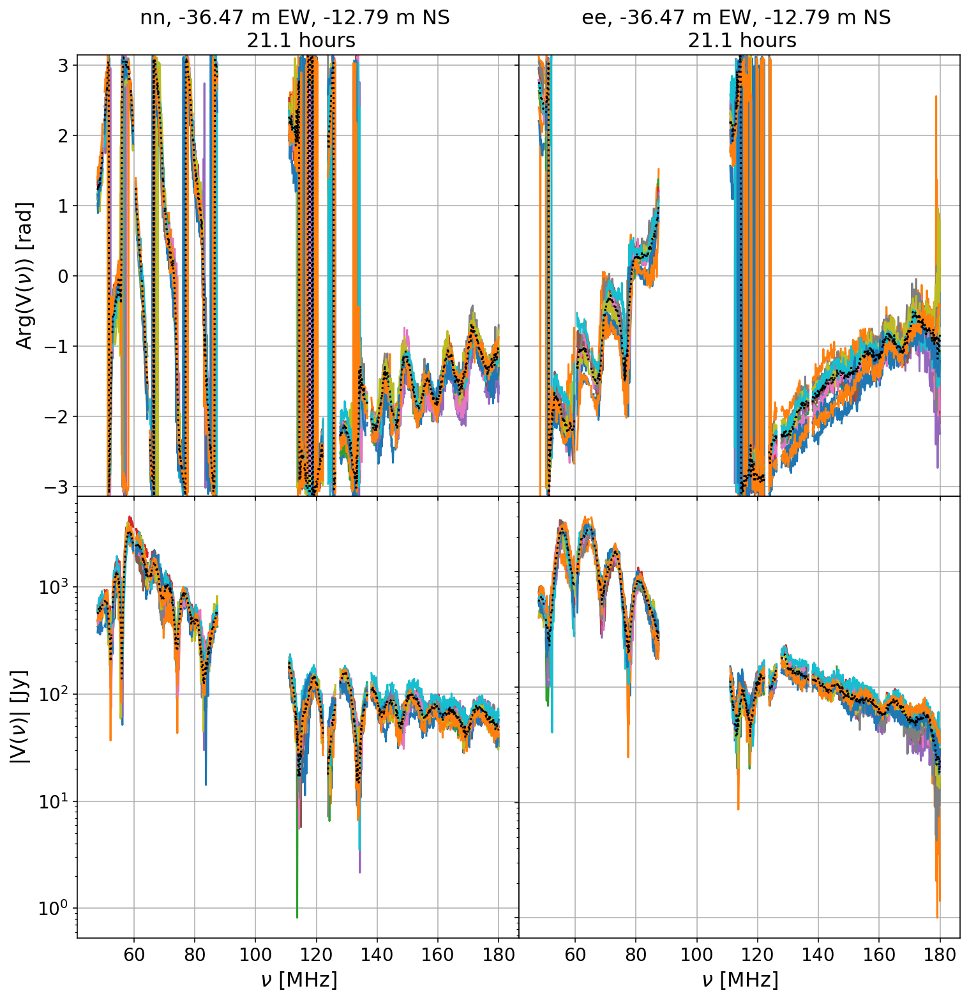

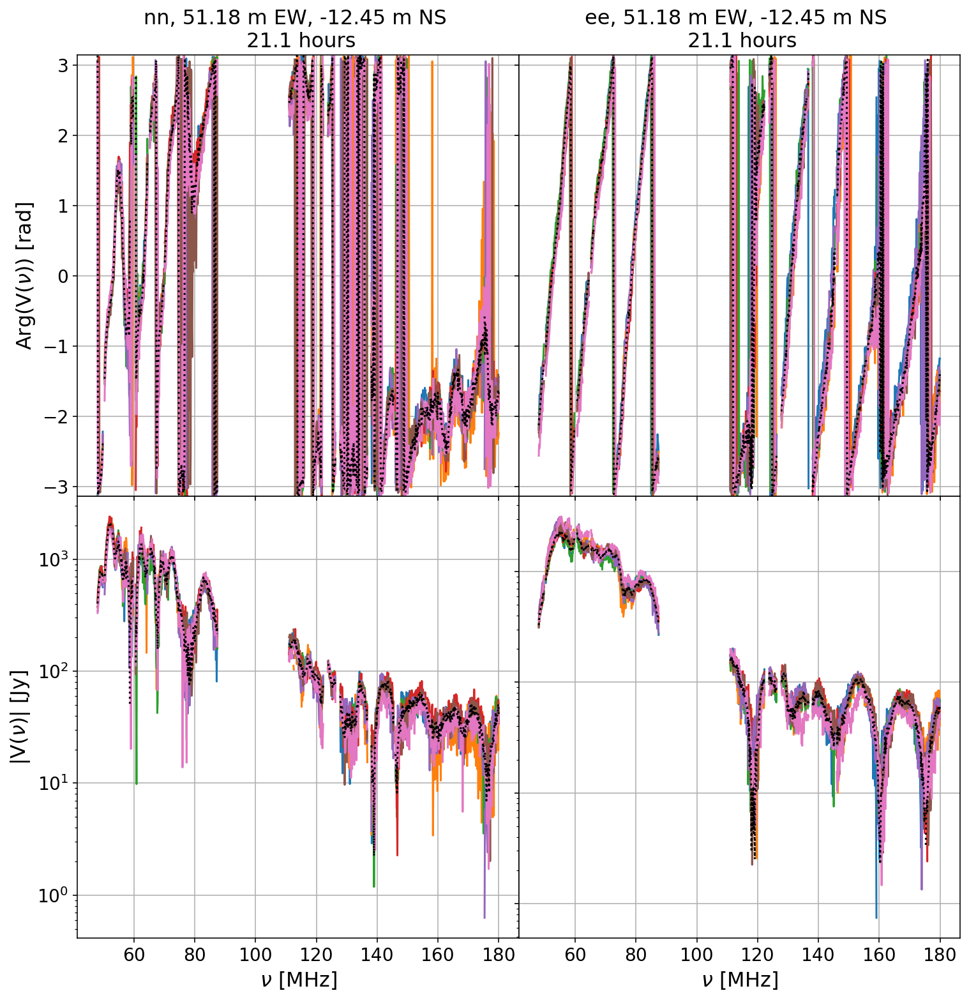

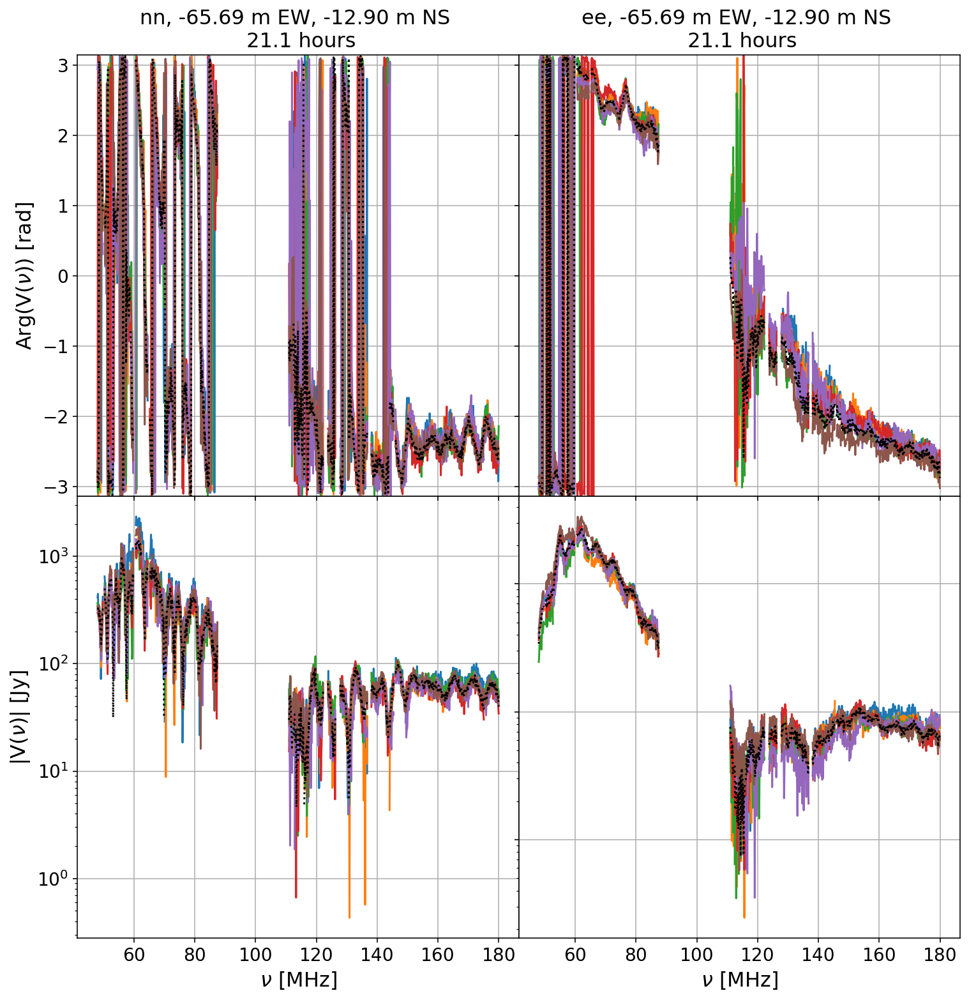

...

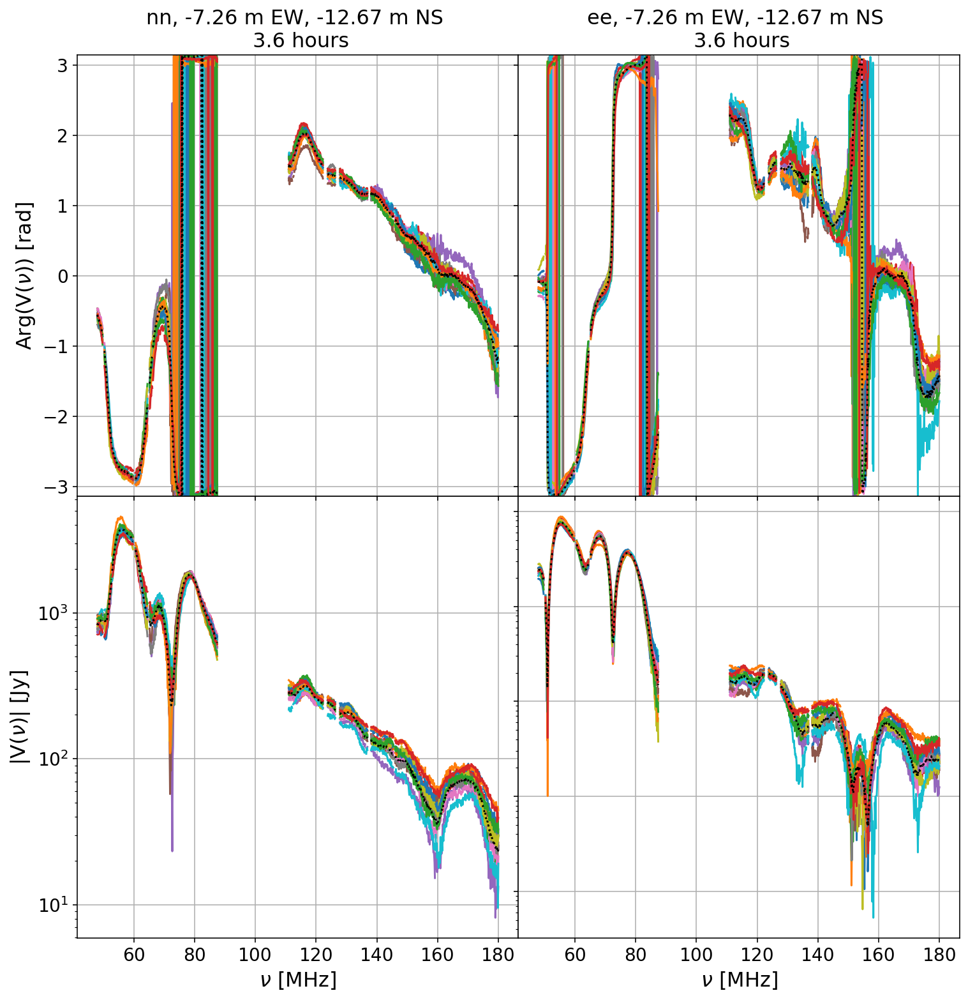

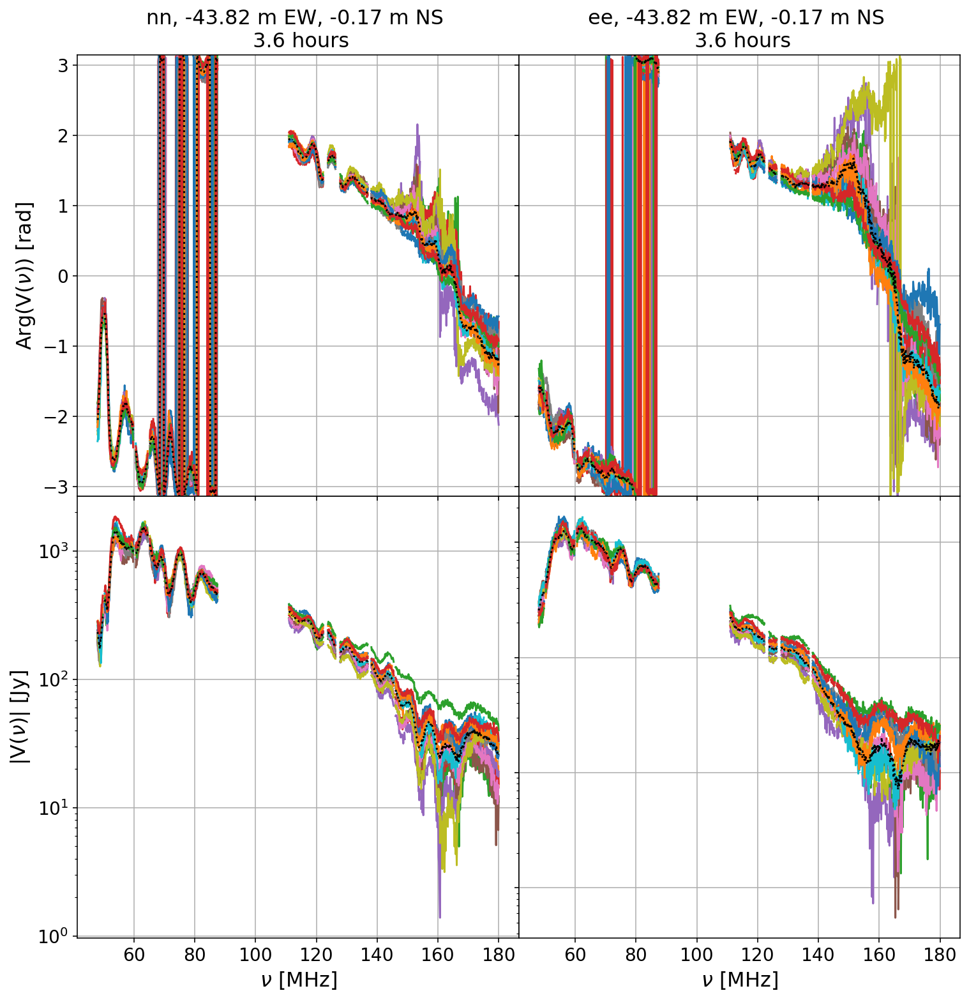

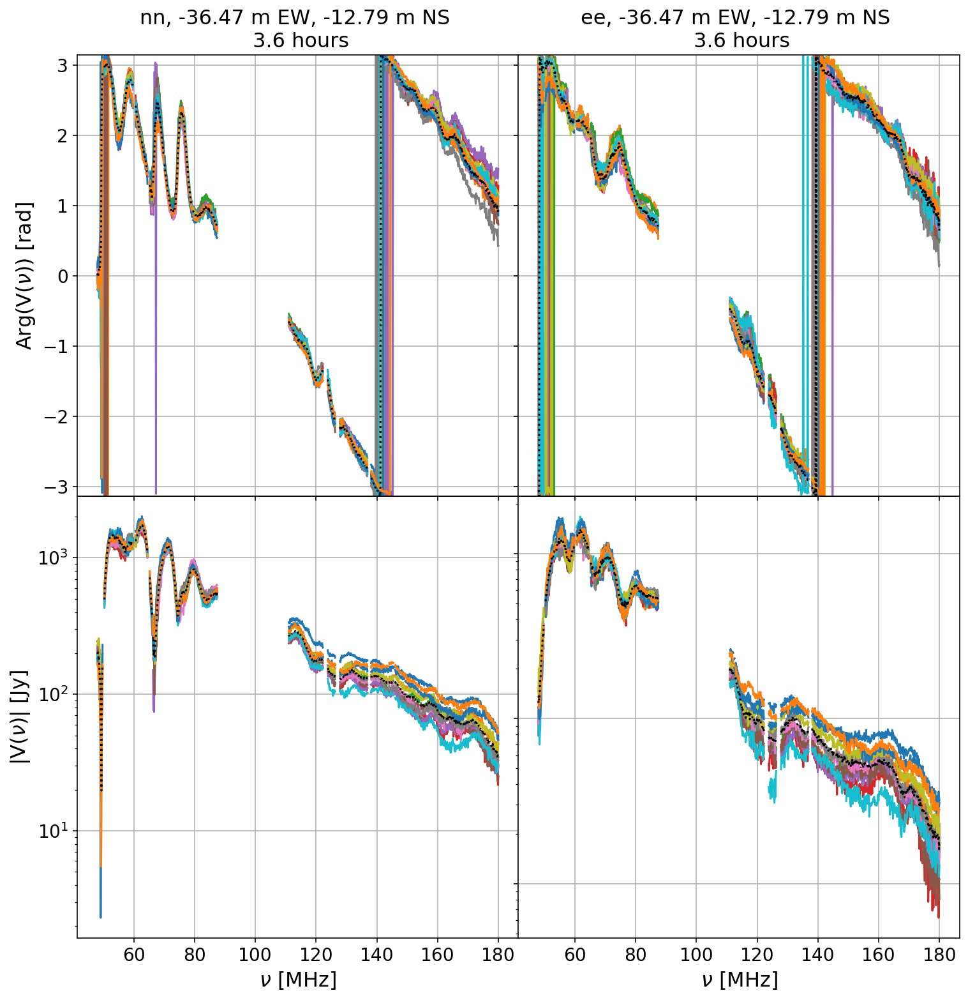

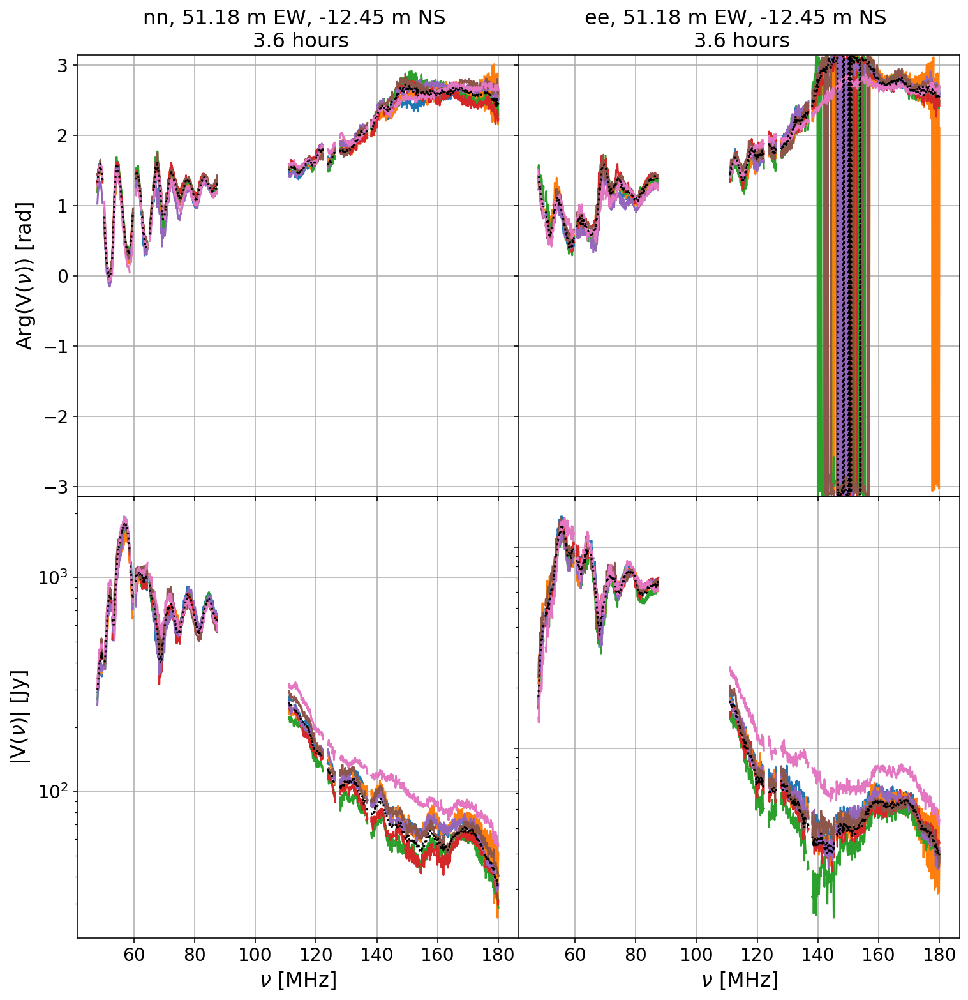

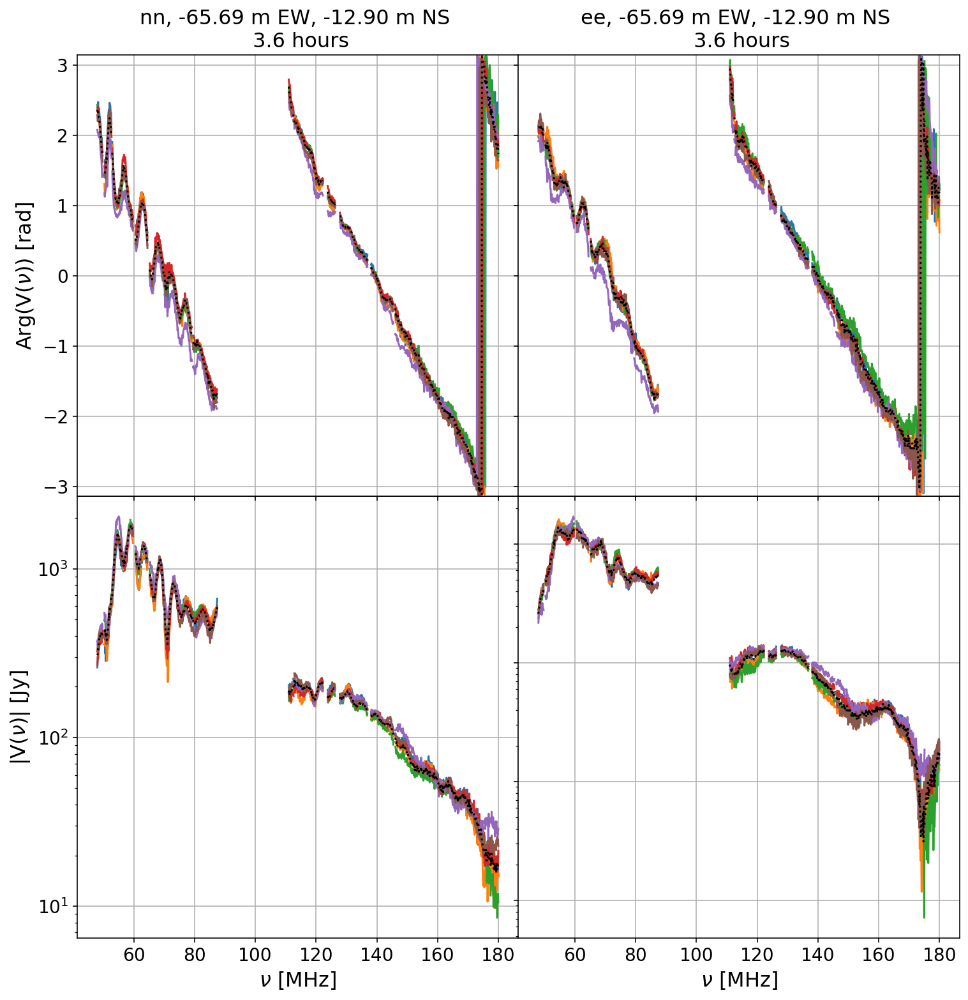

In [23]:
np.seterr(divide='ignore', invalid='ignore')

for smooth_chunk, cal_chunk, sum_chunk in zip(smooth_avg_chunks, cal_chunks, sum_chunks):
    hds = io.HERAData(smooth_chunk)
    if len(hds.filepaths) > 1:
        antpos = list(hds.antpos.values())[0]
    else:
        antpos = hds.antpos
    reds = redcal.get_reds(antpos)
    nreds = [len(grp) for grp in reds]
    rorder = np.argsort(nreds)[::-1]
    bl_grps = rorder[bl_grp_start:bl_grp_start + bl_grp_stride * n_bl_grps:bl_grp_stride]
    for grpnum, grpind in enumerate(bl_grps): # exclude autocorrs
        bls_2_load = reds[grpind] + [bl[:2] + ('ee', ) for bl in reds[grpind]]
        bl_grp = bls_2_load[0]
        hds = io.HERAData(smooth_chunk)
        ds, fs, ns = hds.read(bls=[bl_grp, bl_grp[:2] + ('ee',)]) # load in smooth avg data.
        hd = io.HERAData(sum_chunk) 
        d, f, n = hd.read(bls=bls_2_load) # load in non redundantly averaged data.
        lst = d.lsts * 12 / np.pi
        # apply smooth cal solutions
        hc = io.HERACal(cal_chunk)
        gains, gain_flags, _, _ = hc.read()
        apply_cal.calibrate_in_place(data=d, new_gains=gains, cal_flags=gain_flags, data_flags=f)
        # plt the amplitudes and phases. 
        fig = plt.figure()
        axarr = [fig.add_axes([.1, .1, .4, .4]), fig.add_axes([.5, .1, .4, .4])]
        axarr = [axarr, [fig.add_axes([.1, .5, .4, .4]), fig.add_axes([.5, .5, .4, .4])]]
        for p, pol in enumerate(['nn', 'ee']):
            plt.sca(axarr[0][p])
            for bl in bls_2_load:
                if bl[-1] == pol and not np.all(f[bl]):
                    plt.plot(d.freqs / 1e6, np.abs(np.sum(d[bl] * ~f[bl], axis=0) / np.sum(~f[bl], axis=0)))
            plt.plot(d.freqs / 1e6, np.abs(np.sum(ds[bl_grp[:2]+(pol, )] * ~fs[bl_grp[:2]+(pol, )], axis=0)\
                                           / np.sum(~fs[bl_grp[:2]+(pol, )], axis=0)), ls=':', color='k')
            plt.yscale('log')

            if p == 0:
                plt.ylabel('|V($\\nu$)| [Jy]', fontsize=16)
            else:
                plt.gca().set_yticklabels([])
            plt.xlabel('$\\nu$ [MHz]', fontsize=16)
            plt.gca().tick_params(labelsize=14)
            plt.grid()
            plt.sca(axarr[1][p])
            for bl in bls_2_load:
                if bl[-1] == pol and not np.all(f[bl]):
                    plt.plot(d.freqs / 1e6, np.angle(np.sum(d[bl] * ~f[bl], axis=0) / np.sum(~f[bl], axis=0)))
            plt.plot(d.freqs / 1e6, np.angle(np.sum(ds[bl_grp[:2]+(pol, )] * ~fs[bl_grp[:2]+(pol, )], axis=0)\
                                           / np.sum(~fs[bl_grp[:2]+(pol, )], axis=0)), ls=':', color='k')
            if p == 0:
                plt.ylabel('Arg(V($\\nu$)) [rad]', fontsize=16)
            else:
                plt.gca().set_yticklabels([])
            blvec = antpos[bl[0]] - antpos[bl[1]]
            plt.title(f'{pol}, {blvec[0]:.2f} m EW, {blvec[1]:.2f} m NS \n {lst[0]:.1f} hours', fontsize=16)
            plt.ylim(-np.pi, np.pi)
            plt.gca().tick_params(labelsize=14)
            plt.grid()
            plt.gca().set_xticklabels([])
        plt.gcf().set_size_inches(12, 12)
        plt.show()
